# Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pip install tensorflow_addons
!pip install -q kaggle

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import (Reshape,LeakyReLU,Dropout,Conv2DTranspose, Add,AveragePooling2D,Lambda,
                                     UpSampling2D, Conv2D, MaxPool2D, Dense,Activation,
                                     Flatten, InputLayer, BatchNormalization, Input, )
from tensorflow.keras.optimizers import Adam

# Data Download

In [ ]:
!pip install -q kaggle
! mkdir "/content/kaggle"
! cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

!kaggle datasets download -d badasstechie/celebahq-resized-256x256
!unzip "/content/celebahq-resized-256x256.zip" -d "/content/dataset/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/celeba_hq_256/25000.jpg  
  inflating: /content/dataset/celeba_hq_256/25001.jpg  
  inflating: /content/dataset/celeba_hq_256/25002.jpg  
  inflating: /content/dataset/celeba_hq_256/25003.jpg  
  inflating: /content/dataset/celeba_hq_256/25004.jpg  
  inflating: /content/dataset/celeba_hq_256/25005.jpg  
  inflating: /content/dataset/celeba_hq_256/25006.jpg  
  inflating: /content/dataset/celeba_hq_256/25007.jpg  
  inflating: /content/dataset/celeba_hq_256/25008.jpg  
  inflating: /content/dataset/celeba_hq_256/25009.jpg  
  inflating: /content/dataset/celeba_hq_256/25010.jpg  
  inflating: /content/dataset/celeba_hq_256/25011.jpg  
  inflating: /content/dataset/celeba_hq_256/25012.jpg  
  inflating: /content/dataset/celeba_hq_256/25013.jpg  
  inflating: /content/dataset/celeba_hq_256/25014.jpg  
  inflating: /content/dataset/celeba_hq_256/25015.jpg  
  inflating: /content/dataset/celeba_hq_256/25016.jpg

#  Preprocessing

In [ ]:
NOISE_DIM = 512
BATCH_SIZE = [16, 16, 16, 16, 16, 16,16,]
EPOCHS = 50

def preprocess(image):
  return tf.cast(image, tf.float32) / 127.5 - 1.0

def create_dataset(res,BATCH_SIZE):
  ds_train = tf.keras.preprocessing.image_dataset_from_directory(
      "/content/dataset/celeba_hq_256", label_mode=None, image_size=(res,res), batch_size=BATCH_SIZE
  )

  train_dataset = (
      ds_train
      .map(preprocess)
      .unbatch()
      .shuffle(buffer_size = 1024, reshuffle_each_iteration = True)
      .batch(BATCH_SIZE,drop_remainder=True)
      .prefetch(tf.data.AUTOTUNE)
  )
  return train_dataset
train_dataset = create_dataset(4,BATCH_SIZE[0])

Found 30000 files belonging to 1 classes.


In [ ]:
for d in create_dataset(256,32).take(1):
  print(d.shape)

Found 30000 files belonging to 1 classes.
(32, 256, 256, 3)


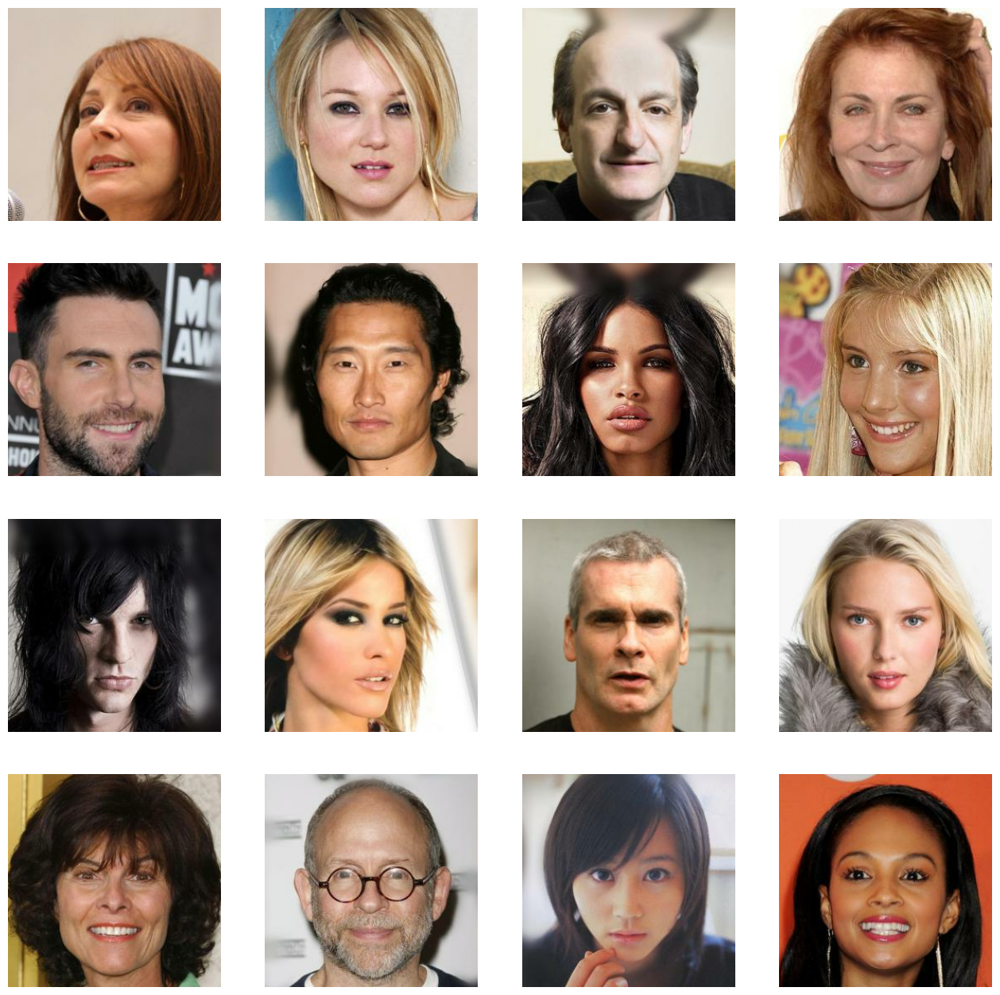

In [ ]:
plt.figure(figsize = (16,16))
k=0
n = 16
for i in range(n):
    ax = plt.subplot(4,4, k+1)
    plt.imshow((d[i]+1)/2)
    plt.axis("off")
    k+=1

# Model

In [ ]:
class PixelNormalization(Layer):
  def __init__(self,):
    super(PixelNormalization, self).__init__()
  def call(self, inputs):
    mean_square = tf.reduce_mean(tf.square(inputs), axis=-1, keepdims=True)
    l2 = tf.math.rsqrt(mean_square + 1.0e-8)
    normalized = inputs * l2
    return normalized

class WeightScaling(Layer):
    def __init__(self, shape, gain = np.sqrt(2),):
      super(WeightScaling, self).__init__()
      #shape = tf.constant(shape, dtype=tf.float32)
      fan_in = tf.math.reduce_prod(shape)
      self.wscale = gain*tf.math.rsqrt(fan_in)

    def call(self, inputs):
      inputs = tf.cast(inputs, tf.float32)
      return inputs * self.wscale

class Bias(Layer):
    def __init__(self, ):
        super(Bias, self).__init__()

    def build(self, input_shape):
        b_init = tf.zeros_initializer()
        self.bias = tf.Variable(
            initial_value = b_init(shape=(input_shape[-1],), dtype='float32'),
            trainable=True)

    def call(self, inputs,):
        return inputs + self.bias

class WeightScalingDense(Layer):
    def __init__(self, n_units,gain,use_pixelnorm=False,activate=None):
      super(WeightScalingDense, self).__init__()
      self.n_units=n_units
      self.gain=gain
      self.use_pixelnorm=use_pixelnorm
      self.activate=activate
    def build(self,input_shape):

      self.dense=Dense(
          self.n_units,
          use_bias=False,
          kernel_initializer=tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
          dtype='float32')
      self.bias=Bias()


    def call(self,inputs):
      in_filters = tf.shape(inputs)[-1]

      x=self.dense(inputs)

      x=WeightScaling(shape=(tf.cast(in_filters,dtype=tf.float32)), gain=self.gain)(x)
      x=self.bias(x)

      if self.activate=='LeakyReLU':
          x=LeakyReLU(0.2)(x)
      elif self.activate=='tanh':
          x=Activation('tanh')(x)

      if self.use_pixelnorm:
          x=PixelNormalization()(x)
      return x

class WeightScalingConv(Layer):
    def __init__(self, n_filters,kernel_size,gain,use_pixelnorm=False,activate=None, strides=(1,1)):
      super(WeightScalingConv, self).__init__()
      self.n_filters=n_filters
      self.gain=gain
      self.kernel_size=kernel_size
      self.use_pixelnorm=use_pixelnorm
      self.activate=activate
      self.strides=strides
    def build(self,input_shape):
      self.conv=Conv2D(
          self.n_filters,
          self.kernel_size,
          strides=self.strides,
          use_bias=False,
          padding="same",
          kernel_initializer=tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
          dtype='float32')
      self.bias=Bias()

    def call(self,inputs):
      in_filters = tf.shape(inputs)[-1]

      x=self.conv(inputs)
      x=WeightScaling(shape=(tf.cast(self.kernel_size[0],dtype=tf.float32),tf.cast(self.kernel_size[1],dtype=tf.float32),tf.cast(in_filters,dtype=tf.float32)), gain=self.gain)(x)
      x=self.bias(x)

      if self.activate=='LeakyReLU':
          x=LeakyReLU(0.2)(x)
      elif self.activate=='tanh':
          x=Activation('tanh')(x)

      if self.use_pixelnorm:
          x = PixelNormalization()(x)
      return x

class MinibatchStdev(Layer):
    def __init__(self, **kwargs):
      super(MinibatchStdev, self).__init__(**kwargs)

    def call(self, inputs):
      mean = tf.reduce_mean(inputs, axis=0, keepdims=True)
      stddev = tf.sqrt(tf.reduce_mean(tf.square(inputs - mean), axis=0, keepdims=True) + 1e-8)
      average_stddev = tf.reduce_mean(stddev, keepdims=True)
      shape = tf.shape(inputs)
      minibatch_stddev = tf.tile(average_stddev, (shape[0], shape[1], shape[2], 1))
      combined = tf.concat([inputs, minibatch_stddev], axis=-1)

      return combined

class WeightedSum(Layer):
    def __init__(self,):
      super(WeightedSum, self).__init__()
    def build(self,input_shape):
      self.alpha = tf.Variable(0., dtype=tf.float32, trainable=False)
    def call(self,inputs):
      return ((1.0 - self.alpha) * inputs[0] + (self.alpha * inputs[1]))


In [ ]:
FILTERS = [512, 256, 128, 64]

In [ ]:
class ProGAN(Model):
    def __init__(self,latent_dim,d_steps=1,gp_weight=10.0,drift_weight=0.001,):
      super(ProGAN, self).__init__()
      self.latent_dim = latent_dim
      self.d_steps = d_steps
      self.gp_weight = gp_weight
      self.drift_weight = drift_weight
      self.n_depth = 0
      self.discriminator = self.init_discriminator()
      self.discriminator_wt_fade = None
      self.generator = self.init_generator()
      self.generator_wt_fade = None

    def init_discriminator(self):
      img_input = Input(shape = (4,4,3))
      img_input = tf.cast(img_input, tf.float32)

      # fromRGB
      x=WeightScalingConv(n_filters=FILTERS[0],kernel_size=(1,1),gain=np.sqrt(2),activate='LeakyReLU')(img_input)

      x = MinibatchStdev()(x)

      x=WeightScalingConv(n_filters=FILTERS[0],kernel_size=(3,3),gain=np.sqrt(2),activate='LeakyReLU')(x)
      x=WeightScalingConv(n_filters=FILTERS[0],kernel_size=(4,4),gain=np.sqrt(2),activate='LeakyReLU', strides=(4,4))(x)

      x = Flatten()(x)

      x= WeightScalingDense(n_units=1,gain=1.)(x)

      d_model = Model(img_input, x, name='discriminator')

      return d_model

    def fade_in_discriminator(self):
      input_shape = list(self.discriminator.input.shape)

      input_shape = (input_shape[1]*2, input_shape[2]*2, input_shape[3])
      img_input = Input(shape = input_shape)
      img_input = tf.cast(img_input, tf.float32)
      ################## Left
      x1 = AveragePooling2D()(img_input)
      x1 = self.discriminator.layers[1](x1)

      x2=WeightScalingConv(FILTERS[self.n_depth],(1,1),np.sqrt(2),activate='LeakyReLU')(img_input)
      x2=WeightScalingConv(FILTERS[self.n_depth],(3,3),np.sqrt(2), activate='LeakyReLU')(x2)
      x2=WeightScalingConv(FILTERS[self.n_depth-1],(3,3),np.sqrt(2), activate='LeakyReLU')(x2)

      x2 = AveragePooling2D()(x2)

      x = WeightedSum()([x1, x2])

      for i in range(2, len(self.discriminator.layers)):
          x2 = self.discriminator.layers[i](x2)
      self.discriminator_stabilize = Model(img_input, x2, name='discriminator')

      for i in range(2, len(self.discriminator.layers)):
          x = self.discriminator.layers[i](x)
      self.discriminator = Model(img_input, x, name='discriminator')
      self.discriminator.summary()

    def stabilize_discriminator(self):
      self.discriminator = self.discriminator_stabilize
      self.discriminator.summary()

    def init_generator(self):
      noise = Input(shape=(self.latent_dim,))
      x = PixelNormalization()(noise)
      x=WeightScalingDense(n_units=4*4*FILTERS[0], gain=np.sqrt(2)/4, activate='LeakyReLU', use_pixelnorm=True)(x)

      x = Reshape((4, 4, FILTERS[0]))(x)

      x=WeightScalingConv(FILTERS[0], kernel_size=(4,4), gain=np.sqrt(2), activate='LeakyReLU', use_pixelnorm=True)(x)
      x=WeightScalingConv(FILTERS[0], kernel_size=(3,3), gain=np.sqrt(2), activate='LeakyReLU', use_pixelnorm=True)(x)
      x=WeightScalingConv(3, kernel_size=(1,1), gain=1., activate='tanh', use_pixelnorm=False)(x)

      g_model = Model(noise, x, name='generator')
      g_model.summary()
      return g_model

    def fade_in_generator(self):
      block_end = self.generator.layers[-2].output
      block_end = UpSampling2D((2,2))(block_end)

      x1 = self.generator.layers[-1](block_end)

      x2=WeightScalingConv(FILTERS[self.n_depth],(3,3),np.sqrt(2),
                           activate='LeakyReLU',use_pixelnorm=True)(block_end)
      x2=WeightScalingConv(FILTERS[self.n_depth],(3,3),np.sqrt(2),
                           activate='LeakyReLU',use_pixelnorm=True)(x2)
      x2=WeightScalingConv(3,(1,1),1.,activate='tanh',use_pixelnorm=False)(x2)

      self.generator_stabilize = Model(self.generator.input, x2, name='generator')

      x = WeightedSum()([x1, x2])
      self.generator = Model(self.generator.input, x, name='generator')

      self.generator.summary()

    def stabilize_generator(self):
        self.generator = self.generator_stabilize
        self.generator.summary()

    def compile(self, d_optimizer, g_optimizer):
        super(ProGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer

    def gradient_penalty(self,batch_size,real_images,fake_images):
      epsilon=tf.random.normal([batch_size,1,1,1],0.0,1.0)
      interpolation=epsilon*real_images+(1-epsilon)*fake_images

      with tf.GradientTape() as gp_tape:
        gp_tape.watch(interpolation)
        prediction=self.discriminator(interpolation,training=True)
      grads=gp_tape.gradient(prediction,interpolation)
      l2_norm=tf.sqrt(tf.reduce_sum(tf.square(grads),axis=[1,2,3]))
      return tf.reduce_mean((l2_norm-1)**2)
    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]

        batch_size = tf.shape(real_images)[0]

        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        with tf.GradientTape() as tape:
            fake_images = self.generator(random_latent_vectors, training=True)
            fake_logits = self.discriminator(fake_images, training=True)
            real_logits = self.discriminator(real_images, training=True)

            d_cost = tf.reduce_mean(fake_logits) - tf.reduce_mean(real_logits)

            gp = self.gradient_penalty(batch_size, real_images, fake_images)

            drift = tf.reduce_mean(tf.square(real_logits))
            d_loss = d_cost + self.gp_weight * gp + self.drift_weight * drift

        d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(d_gradient, self.discriminator.trainable_variables))

        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        with tf.GradientTape() as tape:
            generated_images = self.generator(random_latent_vectors, training=True)
            gen_img_logits = self.discriminator(generated_images, training=True)
            g_loss = -tf.reduce_mean(gen_img_logits)
        g_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(g_gradient, self.generator.trainable_variables))
        return {'d_loss': d_loss, 'g_loss': g_loss}

In [ ]:
class ShowImage(tf.keras.callbacks.Callback):
    def __init__(self,prefix,res,latent_dim=512,steps_per_epoch=1000,epochs=50,):
        self.latent_dim = latent_dim
        self.prefix=prefix
        self.steps_per_epoch=steps_per_epoch
        self.epochs=epochs
        self.res=res

    def on_epoch_begin(self, epoch, logs=None):
        self.n_epoch = epoch

    def on_epoch_end(self, epoch, logs=None):
        n=6
        k=0
        out=self.model.generator(tf.random.normal(shape=(36, self.latent_dim)))
        plt.figure(figsize=(16,16))
        for i in range(n):
          for j in range(n):
            ax=plt.subplot(n,n,k+1)
            plt.imshow((out[k]+1)/2,)
            plt.axis('off')
            k+=1
        plt.savefig("generated/gen_images_{}x{}_{}_epoch_{}.png".format(self.res,self.res,self.prefix,epoch+1))

    def on_batch_begin(self, batch, logs=None):
      alpha = ((self.n_epoch * self.steps_per_epoch) + batch)/ float(self.steps_per_epoch * self.epochs - 1)
      for layer in self.model.generator.layers:
        if isinstance(layer, WeightedSum):
          layer.alpha.assign(alpha)
      for layer in self.model.discriminator.layers:
        if isinstance(layer, WeightedSum):
          layer.alpha.assign(alpha)

In [ ]:
!mkdir generated

In [ ]:
STEPS_PER_EPOCH=2500
EPOCHS=20
NOISE_DIM=512

In [ ]:
20*16*2500

800000

# Train

## Compile

In [ ]:
train_dataset = create_dataset(4,BATCH_SIZE[0])
generator_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001, beta_1=0.0, beta_2=0.99, epsilon=1e-8)
discriminator_optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001, beta_1=0.0, beta_2=0.99, epsilon=1e-8)

model = ProGAN(
    latent_dim = NOISE_DIM,
    d_steps = 1,
)

model.compile(
    d_optimizer=discriminator_optimizer,
    g_optimizer=generator_optimizer,
)

cbk=ShowImage('initial',4,latent_dim=512,steps_per_epoch=STEPS_PER_EPOCH,epochs=EPOCHS)

Found 30000 files belonging to 1 classes.
Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 512)]             0         
                                                                 
 pixel_normalization_1 (Pix  (None, 512)               0         
 elNormalization)                                                
                                                                 
 weight_scaling_dense_3 (We  (None, 8192)              4202496   
 ightScalingDense)                                               
                                                                 
 reshape_1 (Reshape)         (None, 4, 4, 512)         0         
                                                                 
 weight_scaling_conv_9 (Wei  (None, 4, 4, 512)         4194816   
 ghtScalingConv)                                                 
               

## Fit

Found 30000 files belonging to 1 classes.
Model: "generator"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 512)]                0         []                            
                                                                                                  
 pixel_normalization_1 (Pix  (None, 512)                  0         ['input_6[0][0]']             
 elNormalization)                                                                                 
                                                                                                  
 weight_scaling_dense_3 (We  (None, 8192)                 4202496   ['pixel_normalization_1[0][0]'
 ightScalingDense)                                                  ]                             
                                                

1875/1875 [==============================] - 69s 29ms/step - d_loss: -2.3785 - g_loss: 3.0219
Epoch 2/20
1875/1875 [==============================] - 54s 29ms/step - d_loss: -3.3230 - g_loss: 4.2119
Epoch 3/20
1875/1875 [==============================] - 54s 29ms/step - d_loss: -3.3748 - g_loss: 4.4940
Epoch 4/20
1875/1875 [==============================] - 54s 29ms/step - d_loss: -2.7928 - g_loss: 3.5518
Epoch 5/20
1875/1875 [==============================] - 54s 29ms/step - d_loss: -2.3809 - g_loss: 2.9859
Epoch 6/20
1875/1875 [==============================] - 54s 29ms/step - d_loss: -1.9355 - g_loss: 2.4940
Epoch 7/20
1875/1875 [==============================] - 54s 29ms/step - d_loss: -1.5380 - g_loss: 2.0491
Epoch 8/20
1875/1875 [==============================] - 54s 29ms/step - d_loss: -1.2568 - g_loss: 1.6953
Epoch 9/20
1875/1875 [==============================] - 54s 29ms/step - d_loss: -0.9872 - g_loss: 1.3857
Epoch 10/20
1875/1875 [==============================] - 54s 29ms/

   1875/Unknown - 53s 27ms/step - d_loss: -0.1715 - g_loss: 0.3240

<ipython-input-21-a26ff24a8bd6>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16,16))


1875/1875 [==============================] - 55s 28ms/step - d_loss: -0.1715 - g_loss: 0.3238
Epoch 2/20
1875/1875 [==============================] - 51s 27ms/step - d_loss: -0.1690 - g_loss: 0.3484
Epoch 3/20
1875/1875 [==============================] - 52s 27ms/step - d_loss: -0.1700 - g_loss: 0.3309
Epoch 4/20
1875/1875 [==============================] - 51s 27ms/step - d_loss: -0.1677 - g_loss: 0.3270
Epoch 5/20
1875/1875 [==============================] - 51s 27ms/step - d_loss: -0.1754 - g_loss: 0.3307
Epoch 6/20
1875/1875 [==============================] - 51s 27ms/step - d_loss: -0.1704 - g_loss: 0.3088
Epoch 7/20
1875/1875 [==============================] - 51s 27ms/step - d_loss: -0.1589 - g_loss: 0.3288
Epoch 8/20
1875/1875 [==============================] - 52s 28ms/step - d_loss: -0.1605 - g_loss: 0.3100
Epoch 9/20
1875/1875 [==============================] - 51s 27ms/step - d_loss: -0.1588 - g_loss: 0.3101
Epoch 10/20
1875/1875 [==============================] - 51s 27ms/

1875/1875 [==============================] - 70s 34ms/step - d_loss: -2.7455 - g_loss: 4.2566
Epoch 2/20
1875/1875 [==============================] - 64s 34ms/step - d_loss: -4.4796 - g_loss: 5.7279
Epoch 3/20
1875/1875 [==============================] - 64s 34ms/step - d_loss: -4.4118 - g_loss: 5.7447
Epoch 4/20
1875/1875 [==============================] - 64s 34ms/step - d_loss: -3.9973 - g_loss: 5.2042
Epoch 5/20
1875/1875 [==============================] - 64s 34ms/step - d_loss: -3.2549 - g_loss: 4.3318
Epoch 6/20
1875/1875 [==============================] - 66s 35ms/step - d_loss: -2.6479 - g_loss: 3.5143
Epoch 7/20
1875/1875 [==============================] - 64s 34ms/step - d_loss: -2.1082 - g_loss: 2.8315
Epoch 8/20
1875/1875 [==============================] - 64s 34ms/step - d_loss: -1.6228 - g_loss: 2.2088
Epoch 9/20
1875/1875 [==============================] - 64s 34ms/step - d_loss: -1.1368 - g_loss: 1.5909
Epoch 10/20
1875/1875 [==============================] - 65s 34ms/

1875/1875 [==============================] - 65s 33ms/step - d_loss: -0.4194 - g_loss: 0.7122
Epoch 2/20
1875/1875 [==============================] - 62s 33ms/step - d_loss: -0.4478 - g_loss: 0.7350
Epoch 3/20
1875/1875 [==============================] - 62s 33ms/step - d_loss: -0.4469 - g_loss: 0.7131
Epoch 4/20
1875/1875 [==============================] - 62s 33ms/step - d_loss: -0.4531 - g_loss: 0.7107
Epoch 5/20
1875/1875 [==============================] - 62s 33ms/step - d_loss: -0.4675 - g_loss: 0.6865
Epoch 6/20
1875/1875 [==============================] - 62s 33ms/step - d_loss: -0.4465 - g_loss: 0.6739
Epoch 7/20
1875/1875 [==============================] - 62s 33ms/step - d_loss: -0.4523 - g_loss: 0.6575
Epoch 8/20
1875/1875 [==============================] - 62s 33ms/step - d_loss: -0.4488 - g_loss: 0.6332
Epoch 9/20
1875/1875 [==============================] - 62s 33ms/step - d_loss: -0.4543 - g_loss: 0.6745
Epoch 10/20
1875/1875 [==============================] - 62s 33ms/

1875/1875 [==============================] - 84s 41ms/step - d_loss: -3.0830 - g_loss: 4.8221
Epoch 2/20
1875/1875 [==============================] - 77s 41ms/step - d_loss: -5.6653 - g_loss: 8.4261
Epoch 3/20
1875/1875 [==============================] - 77s 41ms/step - d_loss: -5.2609 - g_loss: 7.4226
Epoch 4/20
1875/1875 [==============================] - 78s 41ms/step - d_loss: -4.5617 - g_loss: 6.3422
Epoch 5/20
1875/1875 [==============================] - 77s 41ms/step - d_loss: -3.5165 - g_loss: 4.9585
Epoch 6/20
1875/1875 [==============================] - 77s 41ms/step - d_loss: -2.8139 - g_loss: 3.9338
Epoch 7/20
1875/1875 [==============================] - 77s 41ms/step - d_loss: -2.0492 - g_loss: 2.9097
Epoch 8/20
1875/1875 [==============================] - 77s 41ms/step - d_loss: -1.5482 - g_loss: 2.2621
Epoch 9/20
1875/1875 [==============================] - 77s 41ms/step - d_loss: -1.0773 - g_loss: 1.6666
Epoch 10/20
1875/1875 [==============================] - 77s 41ms/

1875/1875 [==============================] - 78s 40ms/step - d_loss: -0.6052 - g_loss: 0.9547
Epoch 2/20
1875/1875 [==============================] - 74s 40ms/step - d_loss: -0.6109 - g_loss: 0.9390
Epoch 3/20
1875/1875 [==============================] - 74s 40ms/step - d_loss: -0.6050 - g_loss: 0.9113
Epoch 4/20
1875/1875 [==============================] - 74s 40ms/step - d_loss: -0.6192 - g_loss: 0.9588
Epoch 5/20
1875/1875 [==============================] - 74s 40ms/step - d_loss: -0.6063 - g_loss: 0.9379
Epoch 6/20
1875/1875 [==============================] - 74s 40ms/step - d_loss: -0.6021 - g_loss: 0.9452
Epoch 7/20
1875/1875 [==============================] - 75s 40ms/step - d_loss: -0.6249 - g_loss: 0.9336
Epoch 8/20
1875/1875 [==============================] - 75s 40ms/step - d_loss: -0.6167 - g_loss: 0.9035
Epoch 9/20
1875/1875 [==============================] - 75s 40ms/step - d_loss: -0.6096 - g_loss: 0.9086
Epoch 10/20
1875/1875 [==============================] - 74s 40ms/

IndexError: ignored

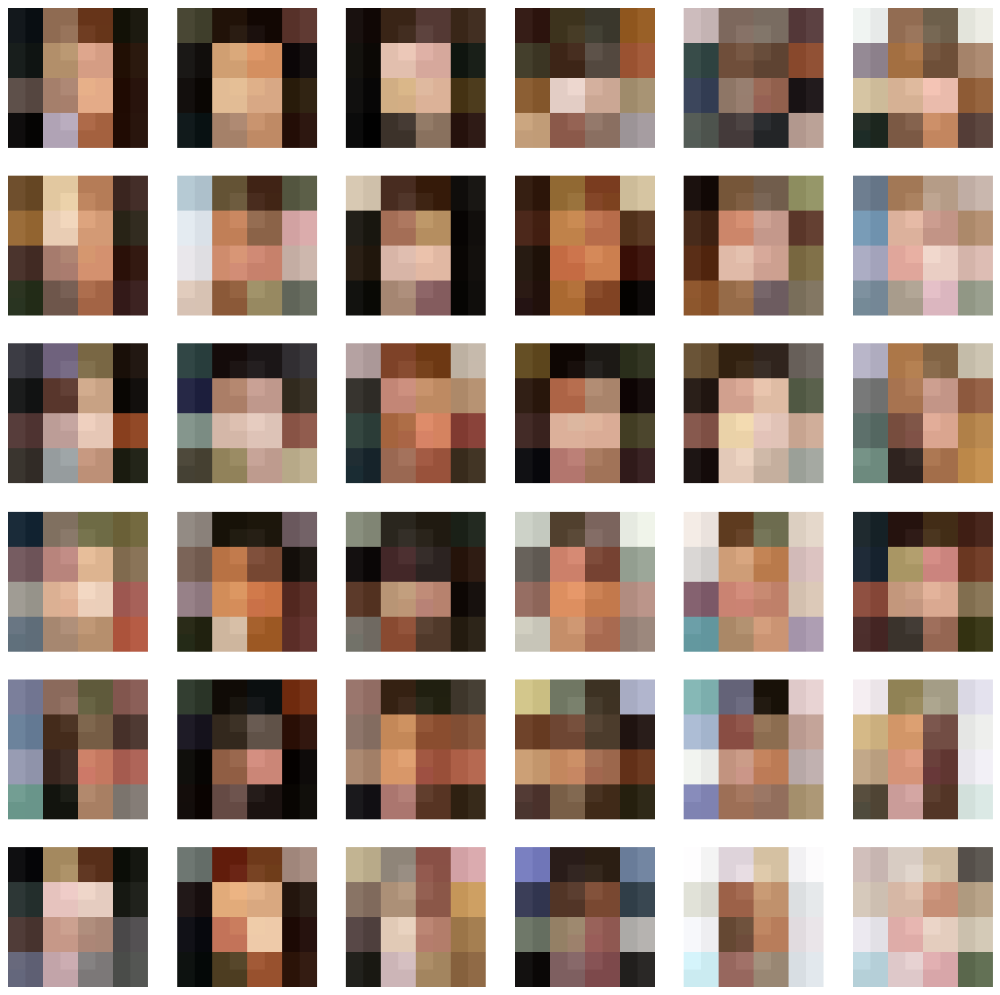

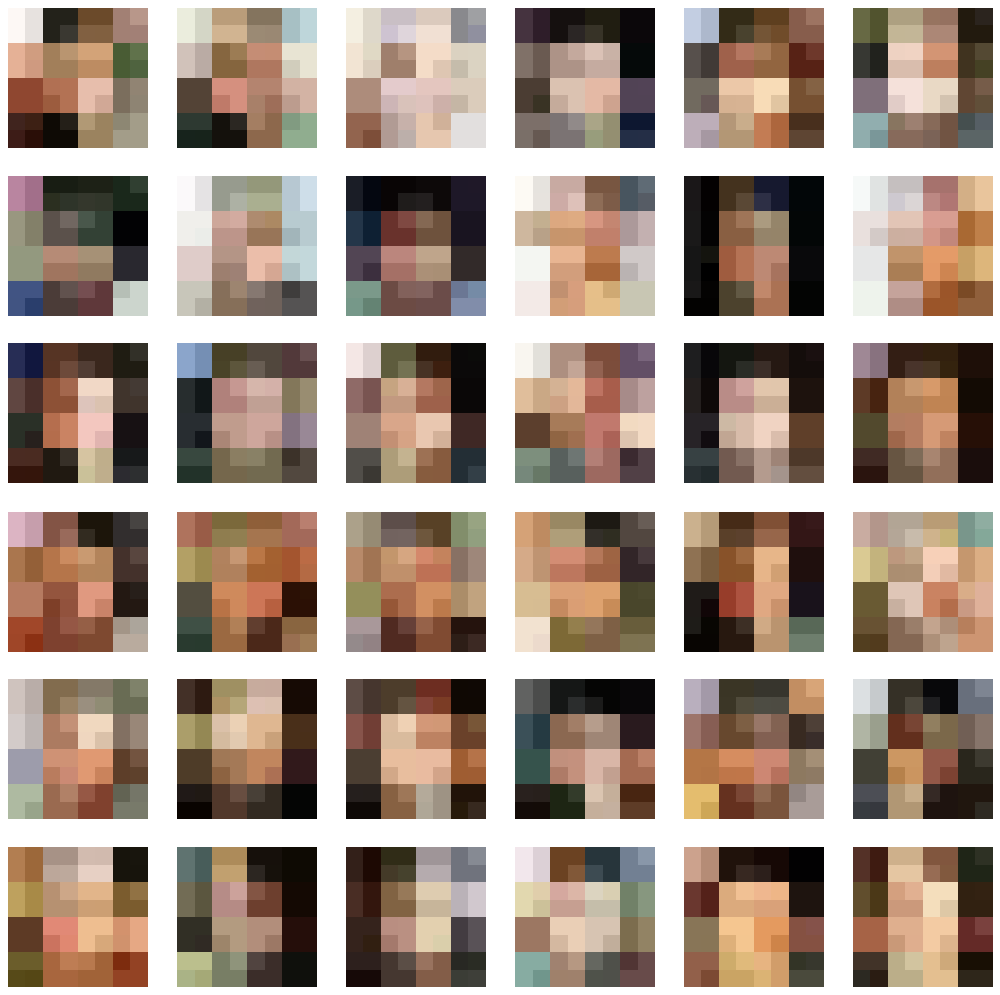

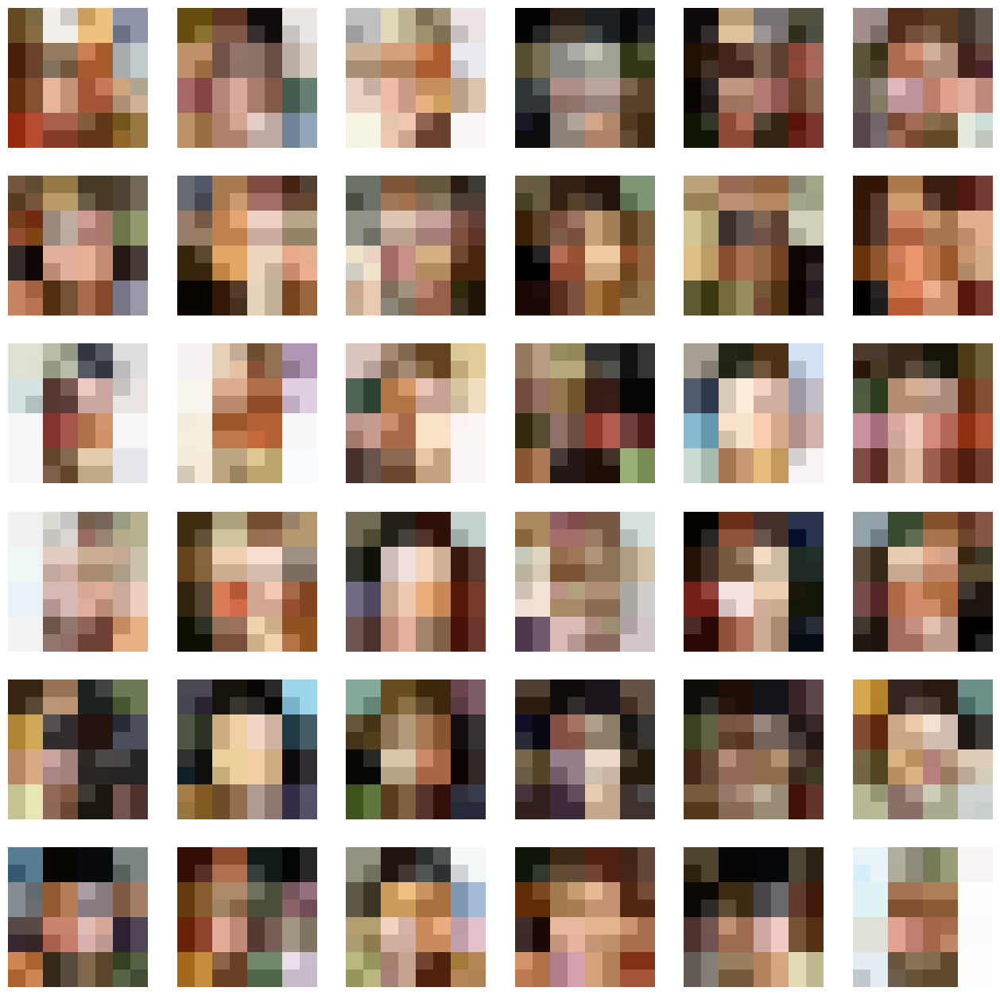

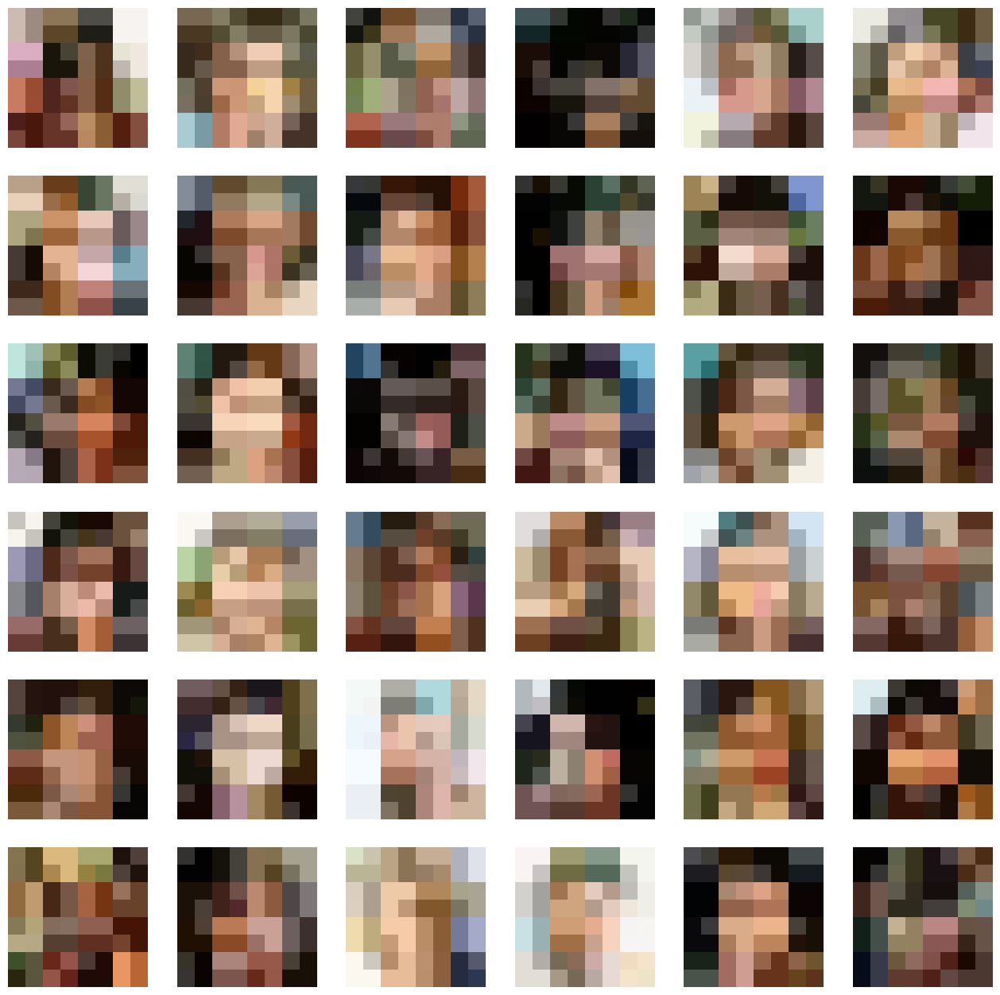

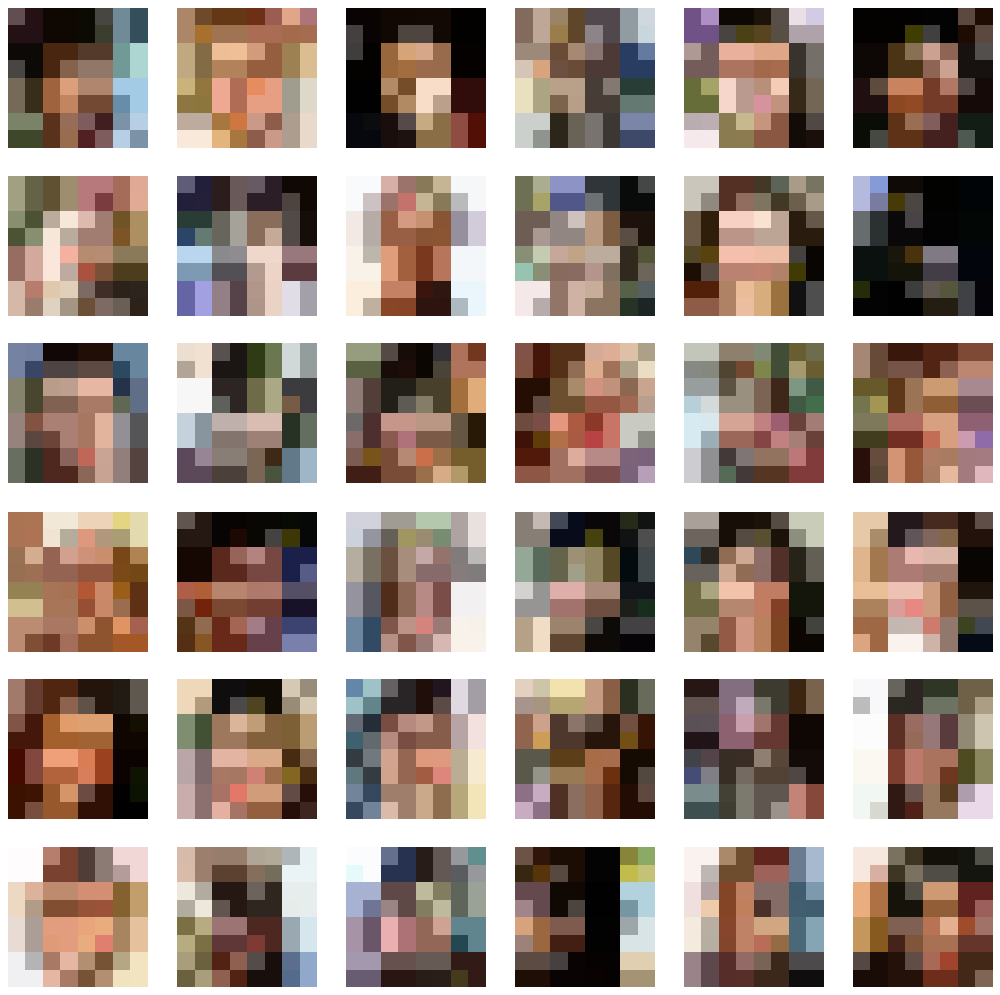

...

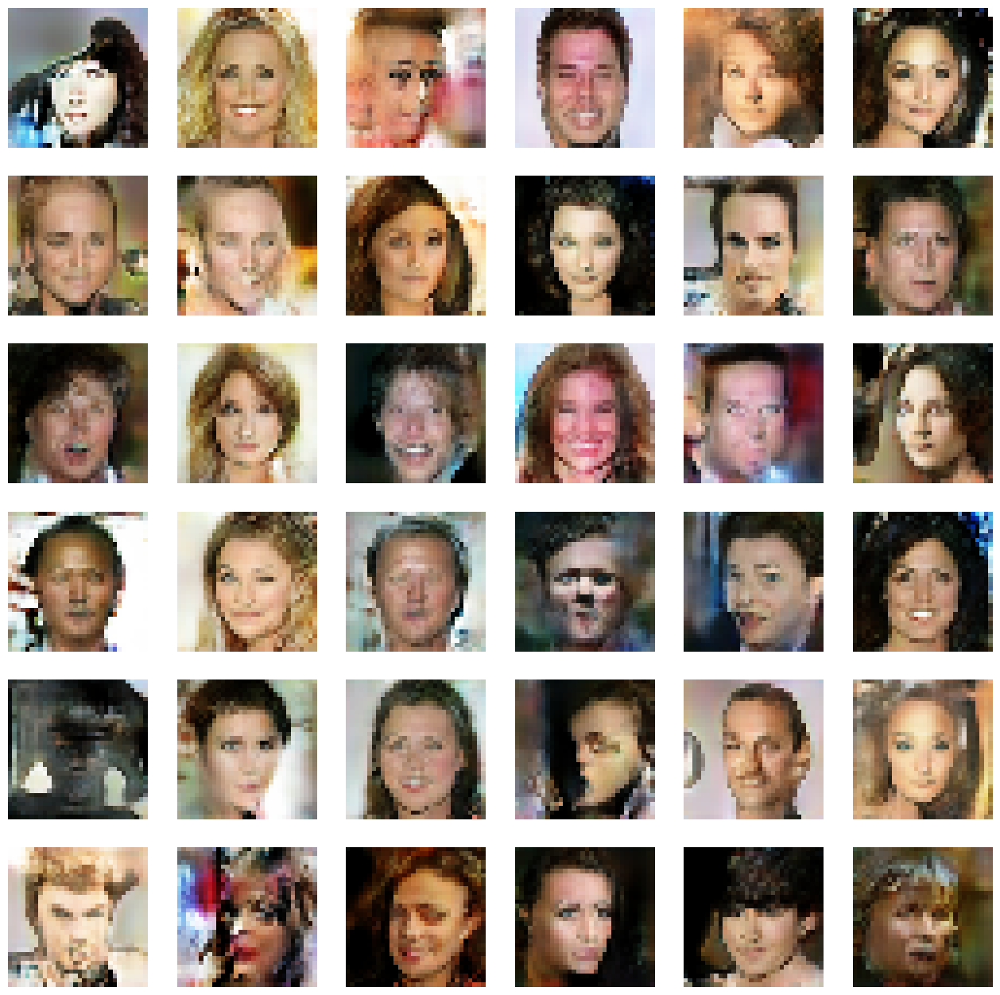

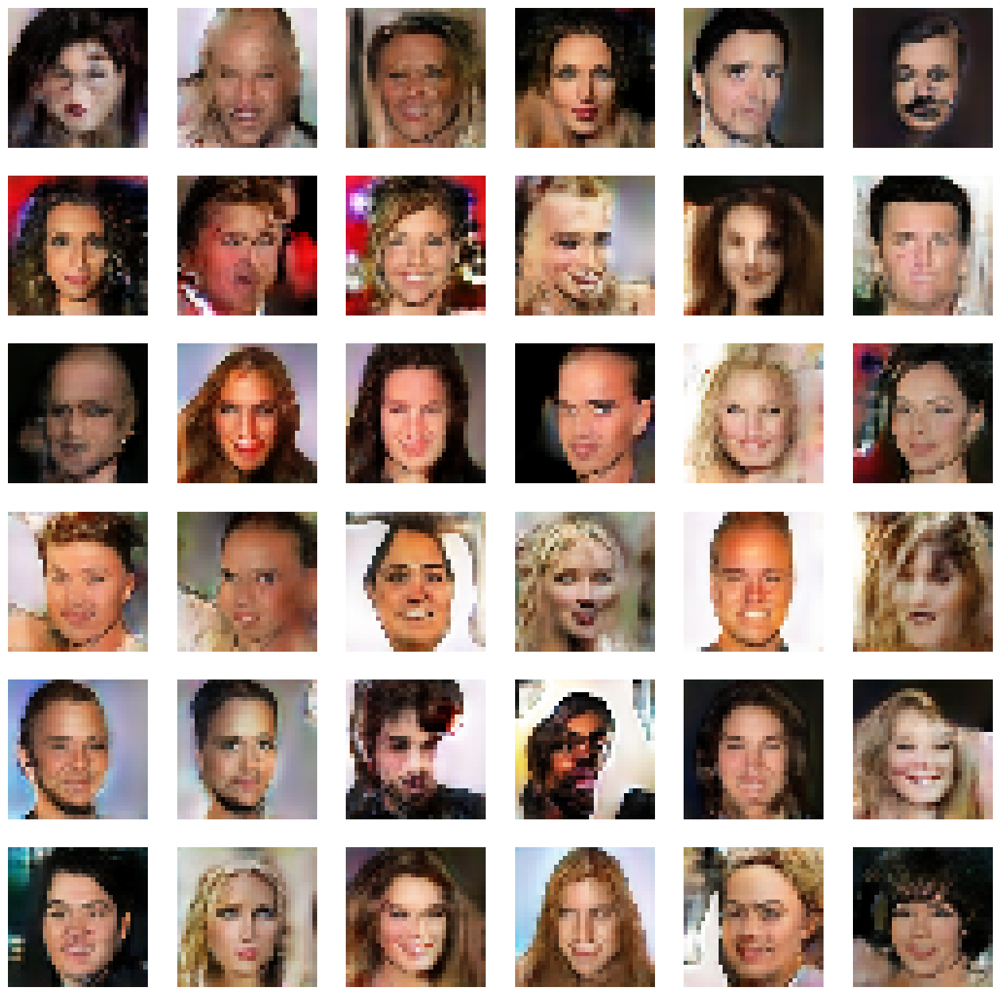

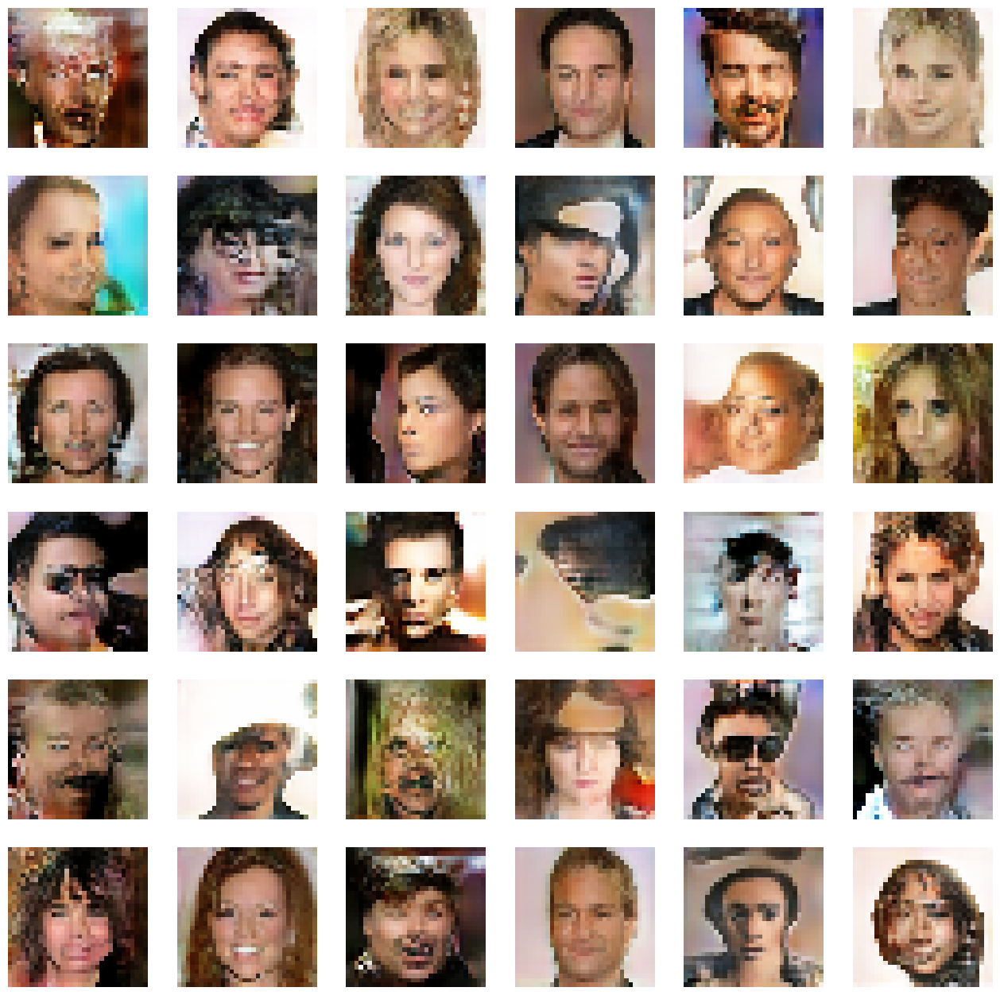

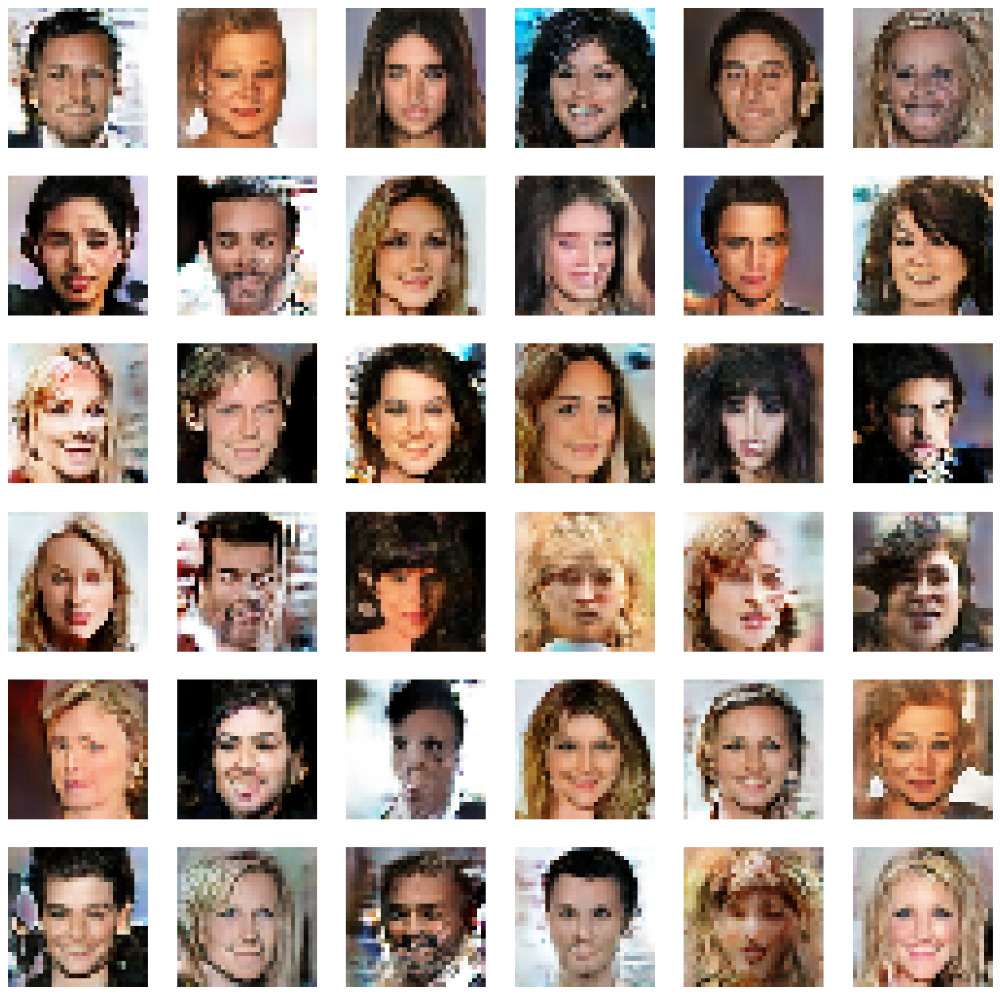

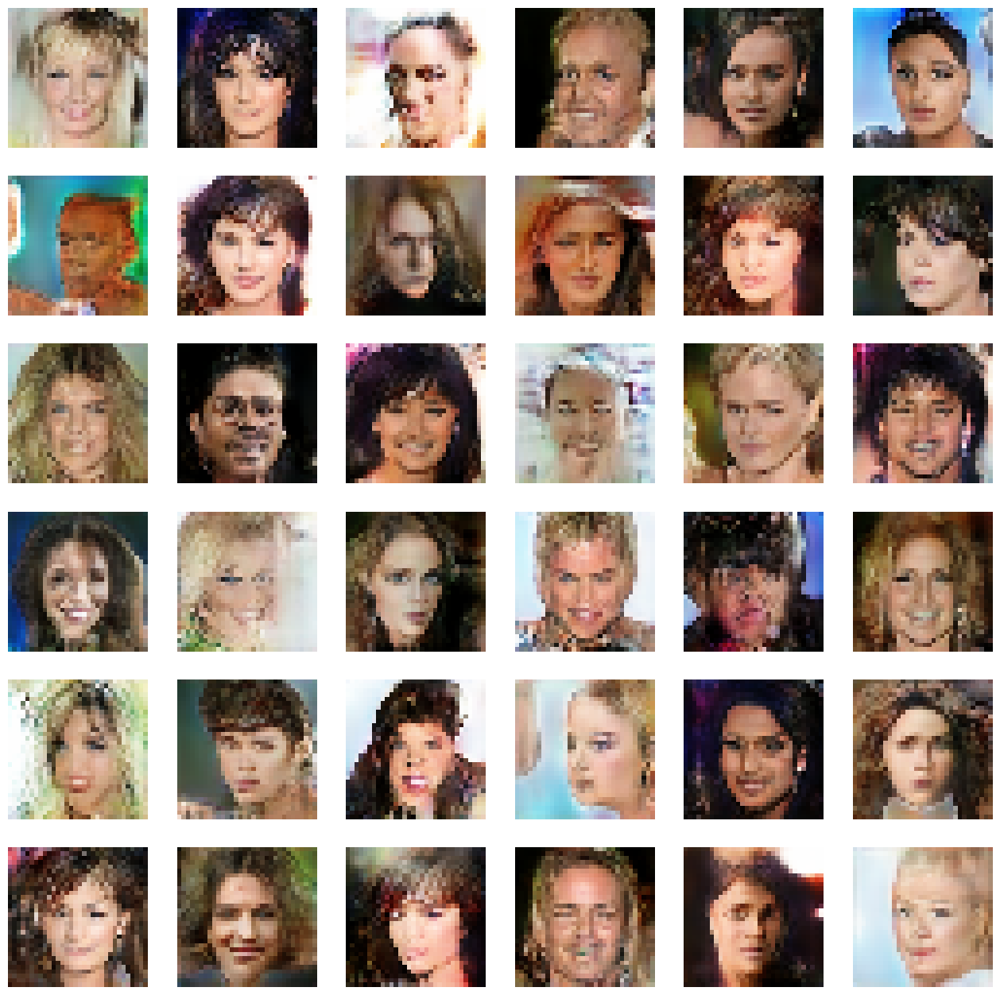

In [ ]:
for n_depth in range(1, 7):

  ################ Faded
  model.n_depth = n_depth
  train_dataset=create_dataset(4*(2**n_depth),BATCH_SIZE[n_depth])

  cbk=ShowImage('fading',4*(2**n_depth),latent_dim=512,steps_per_epoch=STEPS_PER_EPOCH,epochs=EPOCHS)
  model.fade_in_generator()
  model.fade_in_discriminator()

  model.compile(
      d_optimizer=discriminator_optimizer,
      g_optimizer=generator_optimizer,
  )

  model.fit(train_dataset.take(STEPS_PER_EPOCH),epochs = EPOCHS, callbacks=[cbk])

  ################# Stabilized

  cbk=ShowImage('stabilize',4*(2**n_depth),latent_dim=512,steps_per_epoch=STEPS_PER_EPOCH,epochs=EPOCHS)
  model.stabilize_generator()
  model.stabilize_discriminator()

  model.compile(
      d_optimizer=discriminator_optimizer,
      g_optimizer=generator_optimizer,
  )
  model.fit(train_dataset.take(STEPS_PER_EPOCH),epochs=EPOCHS, callbacks=[cbk])

# Save Weights

In [ ]:
pgan.generator.save_weights('pggan_generator_128.h5')
pgan.discriminator.save_weights('pggan_discriminator_128.h5')